<a href="https://colab.research.google.com/github/felipemaiapolo/tinyBenchmarks/blob/main/demo/tinyBenchmarks_MMLU_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# tinyBenchmarks - Demo

This is a demo for the contents in '*tinyBenchmarks: evaluating LLMs with fewer examples*'. It demonstrates how to obtain accuracy estimates from a small subset of benchmark examples. In this demo, we focus on MMLU and download data from the Open LLM Leaderboard.

The train data was obtained in Jan 18th, 2024. Please select models added to the leaderboard after that date to guarantee there is no data leakage.

In [1]:
!pip install -q datasets
!pip install git+https://github.com/felipemaiapolo/tinyBenchmarks

import os
import sys
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm
import numpy as np
import pickle as pkl
import tinyBenchmarks as tb

# Downloading utils.py with functions that download data from the Open LLM Leaderboard
import requests
url = "https://raw.githubusercontent.com/felipemaiapolo/tinyBenchmarks/main/demo/utils.py"
response = requests.get(url)
if response.status_code == 200:
  # Write the content to a file
  with open("utils.py", "wb") as file:
    file.write(response.content)
BASE_PATH = '/content/'
sys.path.append(BASE_PATH)
from utils import download_and_preprocess_correctness, available_models

^C
ERROR: Operation cancelled by user
  Cloning https://github.com/felipemaiapolo/tinyBenchmarks to /private/var/folders/8d/p_dpn5ts3p13wt72yp6pg_tw0000gn/T/pip-req-build-8wa2izhb
  Running command git clone --filter=blob:none --quiet https://github.com/felipemaiapolo/tinyBenchmarks /private/var/folders/8d/p_dpn5ts3p13wt72yp6pg_tw0000gn/T/pip-req-build-8wa2izhb
  Resolved https://github.com/felipemaiapolo/tinyBenchmarks to commit 9c7e20302301ad531bfdfd9a7288e6e916bf22e9
  Preparing metadata (setup.py) ... done
  Using cached requests-2.31.0-py3-none-any.whl.metadata (4.6 kB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-macosx_11_0_arm64.whl.metadata (33 kB)
  Using cached urllib3-2.2.1-py3-none-any.whl.metadata (6.4 kB)
  Using cached certifi-2024.2.2-py3-none-any.whl.metadata (2.2 kB)
Using cached requests-2.31.0-py3-none-any.whl (62 kB)
Using cached certifi-2024.2.2-py3-none-any.whl (163 kB)
Using cached charset_normalizer-3.3.2-cp310-cp310-macosx_11_0_arm64.whl (120 kB)
   ━━

ModuleNotFoundError: No module named 'matplotlib'

## Download leaderboard

We first have to download the correctness scores of the chosen `models`. Afterwards, we preprocess the correctness data and cast it into an array with  the shape (`n_models`, `n_benchmark_datapoints`). There might be missing data for some models and we will skip those models in the preprocessing.

In [ ]:
### Choose from some pre-specified set of models
#SIZE_MODEL_SUBSET = 10
#models = available_models[:SIZE_MODEL_SUBSET]

### Give a list of models.
# Instructions: (i)   Access https://huggingface.co/spaces/HuggingFaceH4/open_llm_leaderboard;
#               (ii)  Find a model of interest in the leaderboard and click on the little icon to the right of its name;
#               (iii) In the newly open page, click on the 'copy' icon on the left of the 'like' button (top of the page);
#               (iv)  Paste the model name into the list below:

models = ['open-llm-leaderboard/details_moreh__MoMo-72B-lora-1.8.7-DPO',
          'open-llm-leaderboard/details_abacusai__Smaug-72B-v0.1',
          'open-llm-leaderboard/details_abacusai__MM-OV-bagel-DPO-34b-c1000-250',
          'open-llm-leaderboard/details_migtissera__Tess-34B-v1.5b']

In [ ]:
mmlu_correctness_data, correctness_stacked = download_and_preprocess_correctness(models)

  0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_22T10_33_58.465501 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

 25%|██▌       | 1/4 [02:05<06:16, 125.64s/it]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_02_04T04_59_32.876763 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

 50%|█████     | 2/4 [04:07<04:06, 123.19s/it]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_56_05.449917 split: 0 examples [00:00, ? examples/s]

Generating 2024_01_24T07_59_43.945933 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

 75%|███████▌  | 3/4 [06:56<02:24, 144.22s/it]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

Generating 2024_01_28T23_12_19.798626 split: 0 examples [00:00, ? examples/s]

Generating latest split: 0 examples [00:00, ? examples/s]

100%|██████████| 4/4 [09:04<00:00, 136.17s/it]


Models skipped in total: 0


 Correctness scores saved to mmlu.pickle


In [ ]:
correctness_stacked.shape

(4, 14042)

## Estimate model accuracies

We will download an object containing the indices of anchor points.

In [ ]:
url = "https://raw.githubusercontent.com/felipemaiapolo/tinyBenchmarks/main/tinyBenchmarks/tinyBenchmarks.pkl"
response = requests.get(url)
with open("tinyBenchmarks.pkl", "wb") as file:
  file.write(response.content)
with open('tinyBenchmarks.pkl', 'rb') as handle:
  tinyBenchmarks = pkl.load(handle)

In [ ]:
benchmark = 'mmlu'

anchor_points = tinyBenchmarks[benchmark]['seen_examples']
subscenarios_position = tinyBenchmarks[benchmark]['subscenarios_position'][benchmark]

We can now predict the model accuracies from the small subset of size number_of_examples. Afterwards, we calculate the error of our predictions to the true accuracy.

In [ ]:
### Evaluating
results = {'model': [],
           'type_evaluation': [],
           'errors': []
           }

errors_IRT, errors_IRTp, errors_IRTpp = [], [], []

for i in range(correctness_stacked.shape[0]):
  y = correctness_stacked[i,:][anchor_points] # Getting correctness just for seen examples
  eval = tb.evaluate(y, benchmark)

  IRT, IRTp, IRTpp = eval[benchmark]['irt'], eval[benchmark]['pirt'], eval[benchmark]['gpirt']

  acc_true = np.mean([np.mean(correctness_stacked[i,:][subscenarios_position[sub]]) for sub in subscenarios_position.keys()])
  errors_IRT += [abs(IRT-acc_true)]
  errors_IRTp += [abs(IRTp-acc_true)]
  errors_IRTpp += [abs(IRTpp-acc_true)]

  print(f"""Model: {mmlu_correctness_data['models'][0][i]}
- True accuracy:                                   {acc_true:10.3f}
- Predicted accuracy based on anchor points (IRT): {IRT:10.3f}
- Predicted accuracy based on p-IRT:               {IRTp:10.3f}
- Predicted accuracy based on gp-IRT (IRT++):      {IRTpp:10.3f}\n""")

type_evaluation = ['anchor points (IRT)', 'p-IRT', 'gp-IRT (IRT++)']
avg_errors = [np.mean(errors) for errors in [errors_IRT, errors_IRTp, errors_IRTpp]]
stds_errors = [np.std(errors) for errors in [errors_IRT, errors_IRTp, errors_IRTpp]]


results_df = pd.DataFrame({'type_evaluation': type_evaluation,
                          'errors': avg_errors,
                          'stds': stds_errors
                          })

Model: open-llm-leaderboard/details_moreh__MoMo-72B-lora-1.8.7-DPO
- True accuracy:                                        0.771
- Predicted accuracy based on anchor points (IRT):      0.808
- Predicted accuracy based on p-IRT:                    0.776
- Predicted accuracy based on gp-IRT (IRT++):           0.780

Model: open-llm-leaderboard/details_abacusai__Smaug-72B-v0.1
- True accuracy:                                        0.772
- Predicted accuracy based on anchor points (IRT):      0.796
- Predicted accuracy based on p-IRT:                    0.774
- Predicted accuracy based on gp-IRT (IRT++):           0.777

Model: open-llm-leaderboard/details_abacusai__MM-OV-bagel-DPO-34b-c1000-250
- True accuracy:                                        0.763
- Predicted accuracy based on anchor points (IRT):      0.781
- Predicted accuracy based on p-IRT:                    0.761
- Predicted accuracy based on gp-IRT (IRT++):           0.763

Model: open-llm-leaderboard/details_migtissera__T

Plot errors (avg +- std)


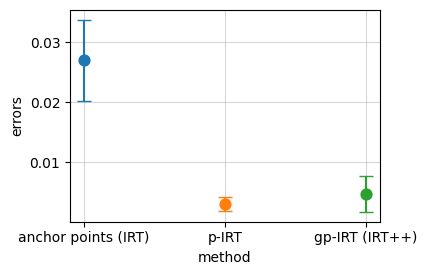

In [ ]:
plt.figure(figsize=(4, 2.75))
pointplot = sns.pointplot(data=results_df, x='type_evaluation', y='errors', hue='type_evaluation')
plt.xlabel('method')
plt.grid(alpha=.5)
ax = plt.gca()
for i, row in results_df.iterrows():
    ax.errorbar(i, row['errors'], yerr=row['stds'], fmt='none', capsize=5, color=plt.cm.tab10.colors[i])


## Evaluate your own model

Feel free to load your own correctness vector.

Replace `y_input` with a vector with number_of_examples `correctness` entries. They should be order according to `anchor_points`. If you are computing the true accuracy of your model, please remember to give equal weights to all subsections of MMLU.

(To be able to edit the colab notebook, save it to your own drive via '*File*' -> '*Save a copy in Drive*')

In [ ]:
# User input
y_input = np.random.binomial(1,.5, 100) # <REPLACE THIS VECTOR>
eval = tb.evaluate(y_input, benchmark)

IRT, IRTp, IRTpp = eval[benchmark]['irt'], eval[benchmark]['pirt'], eval[benchmark]['gpirt']

In [ ]:
print(f"""- Predicted accuracy based on anchor points (IRT): {IRT:10.3f}
- Predicted accuracy based on p-IRT:               {IRTp:10.3f}
- Predicted accuracy based on gp-IRT (IRT++):      {IRTpp:10.3f}\n""")

- Predicted accuracy based on anchor points (IRT):      0.511
- Predicted accuracy based on p-IRT:                    0.531
- Predicted accuracy based on gp-IRT (IRT++):           0.529

